In [1]:
%load_ext autoreload
%autoreload 2

## Imports

In [2]:
import torch
import torchvision
from torchvision import transforms
# from datasets import load_from_disk
# from transformers import AutoTokenizer

import os
import itertools
import json
import numpy as np
from tqdm import tqdm
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

Matplotlib created a temporary config/cache directory at /tmp/pbs.2894675.pbsha.ib.sockeye/matplotlib-46iklvaf because the default path (/home/willib/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [3]:
from torch_spotlight.datasets import *
from torch_spotlight.utils import *
from torch_spotlight.plot_utils import *

setupPlots()

In [4]:
import wilds
from wilds import get_dataset
from wilds.common.data_loaders import get_train_loader, get_eval_loader
from wilds.common.grouper import CombinatorialGrouper

In [5]:
import csv

In [6]:
os.environ['DATA_DIR'] = os.environ['TMPDIR']

In [7]:
data_dir = os.environ['DATA_DIR'] + '/data'
waterbirds_dir = os.path.join(data_dir, 'waterbirds_v1.0')

## Dataset

In [8]:
dataset = get_dataset(dataset='waterbirds', root_dir=data_dir)
waterbirds_train = dataset.get_subset('train')
waterbirds_val = dataset.get_subset('val')
waterbirds_test = dataset.get_subset('test')

In [25]:
# 1 is waterbirds, 0 is landbirds
image = waterbirds_test[77][0]
print(np.array(waterbirds_test[11][2]))
print(np.array(waterbirds_test[11][2])[0] == 1)
print(np.array(waterbirds_test[11][2])[1] == 0)

[1 1]
True
False


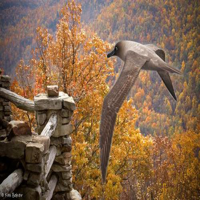

In [47]:
image.resize((200,200))   #any size 

## Model outputs / Loss

In [9]:
# pwd is '/scratch/st-kevinlb-1/will/jupyter/spotlight'
inf_results = loadResults(
    os.path.join(os.getcwd(),'inference_results/waterbirds_train_resnet.pkl'),
)
losses = inf_results.losses
print(losses)

tensor([0.5619, 0.4382, 0.5125,  ..., 0.6633, 0.3784, 0.6857])


In [61]:
# pwd is '/scratch/st-kevinlb-1/will/jupyter/spotlight'
inf_results = loadResults(
    os.path.join(os.getcwd(),'inference_results/waterbirds_val_resnet.pkl'),
)
losses = inf_results.losses

In [13]:
# pwd is '/scratch/st-kevinlb-1/will/jupyter/spotlight'
inf_results = loadResults(
    os.path.join(os.getcwd(),'inference_results/waterbirds_test_resnet.pkl'),
)
losses = inf_results.losses

/home/willib/.local/lib/python3.7/site-packages/matplotlib/text.py:1215: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


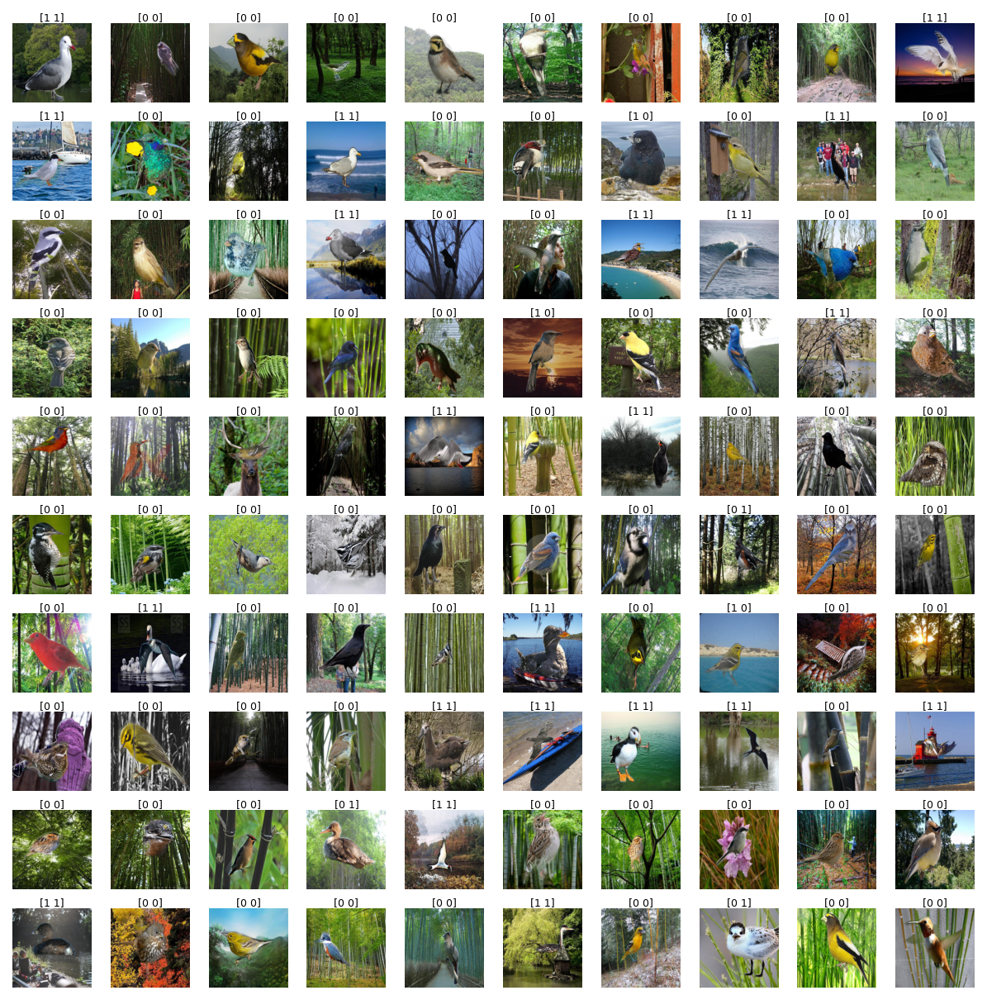

In [10]:
loss_idx = np.array(losses).argsort()[::-1]
examples = [waterbirds_train[i] for i in loss_idx[:100]]
example_losses = [losses[i] for i in loss_idx[:100]]
titles = [np.array(example[2]) for example in examples]
images = [torch.tensor(np.array(example[0].resize((200,200)))).permute((2,0,1)) for example in examples]

# titles = ['%.2f' % loss for loss in example_losses]
plotImageGrid((8, 8), (10, 10), images, titles)
plt.savefig(os.path.join('/scratch/st-kevinlb-1/will/jupyter/spotlight/picture', 'highest_loss_train'))
plt.show()

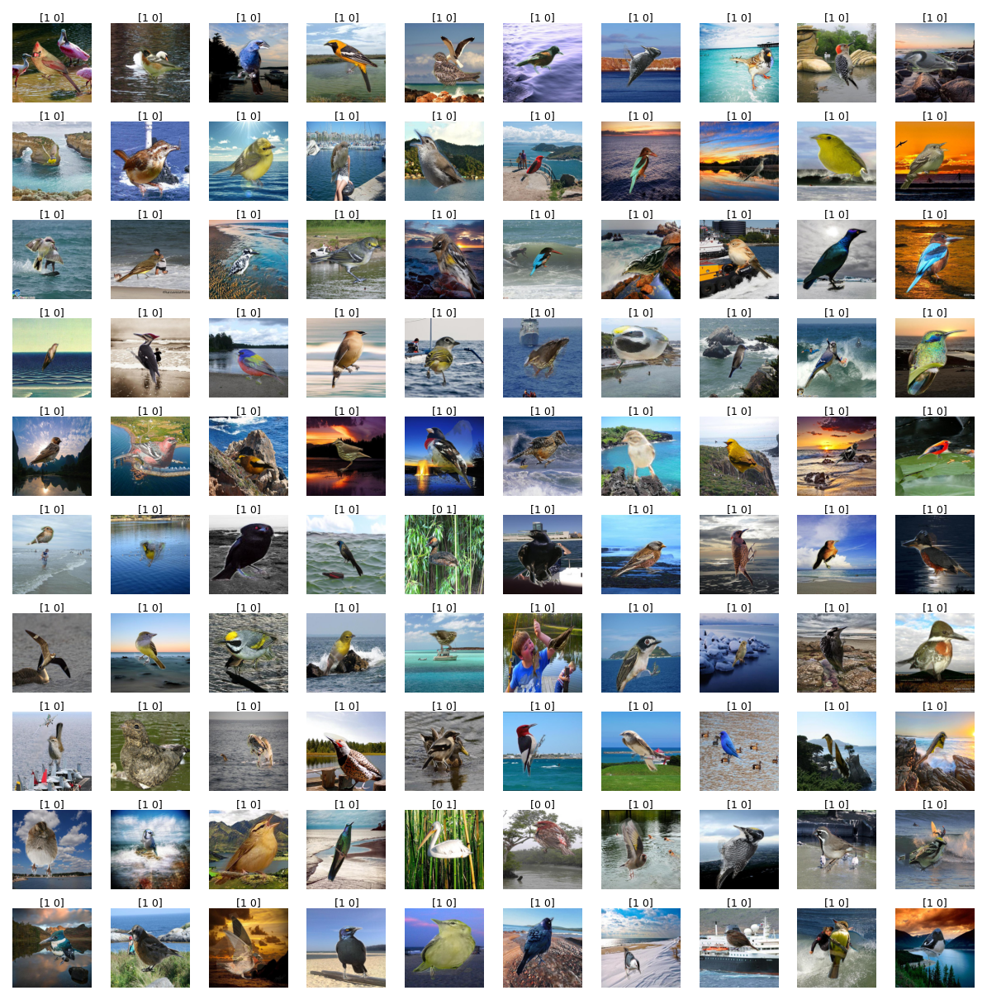

In [12]:
loss_idx = np.array(losses).argsort()[::-1]
examples = [waterbirds_val[i] for i in loss_idx[:100]]
example_losses = [losses[i] for i in loss_idx[:100]]
titles = [np.array(example[2]) for example in examples]
images = [torch.tensor(np.array(example[0].resize((200,200)))).permute((2,0,1)) for example in examples]

# titles = ['%.2f' % loss for loss in example_losses]
plotImageGrid((8, 8), (10, 10), images, titles)
plt.savefig(os.path.join('/scratch/st-kevinlb-1/will/jupyter/spotlight/picture', 'highest_loss_val'))
plt.show()

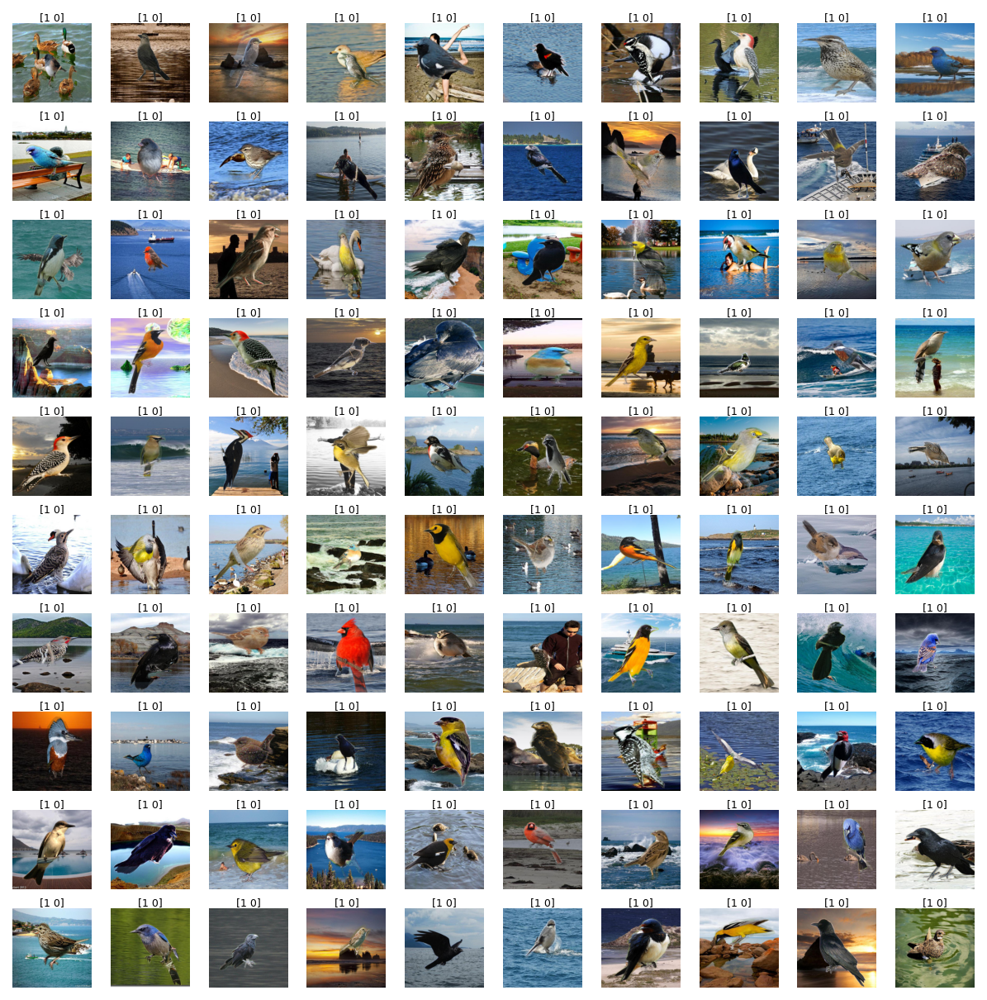

In [14]:
loss_idx = np.array(losses).argsort()[::-1]
examples = [waterbirds_test[i] for i in loss_idx[:100]]
example_losses = [losses[i] for i in loss_idx[:100]]
titles = [np.array(example[2]) for example in examples]
images = [torch.tensor(np.array(example[0].resize((200,200)))).permute((2,0,1)) for example in examples]

# titles = ['%.2f' % loss for loss in example_losses]
plotImageGrid((8, 8), (10, 10), images, titles)
plt.savefig(os.path.join('/scratch/st-kevinlb-1/will/jupyter/spotlight/picture', 'highest_loss_test'))
plt.show()

## Spotlights

In [72]:
spotlights = {}
for count in np.arange(1, 6):
    spotlights[count] = loadResults(f'spotlight_results/waterbirds_train_resnet_0.02_spherical_{count}.pkl')

In [63]:
spotlights = {}
for count in np.arange(1, 6):
    spotlights[count] = loadResults(f'spotlight_results/waterbirds_val_resnet_0.02_spherical_{count}.pkl')

In [87]:
spotlights = {}
for count in np.arange(1, 6):
    spotlights[count] = loadResults(f'spotlight_results/waterbirds_test_resnet_0.02_spherical_{count}.pkl')

## Test spotlight component

In [89]:
print(spotlights[1].unnormalized_weights)
print(spotlights[1].spotlight_mean)
print(spotlights[1].spotlight_precision)

[3.8725333e-03 8.5854958e-07 1.8939430e-02 ... 1.6300957e-06 1.5777341e-04
 6.4812697e-02]
tensor([0.0007, 0.0017, 0.0532,  ..., 0.0077, 0.0897, 0.0542], device='cuda:0',
       requires_grad=True)
tensor([[1.3617, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 1.3617, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 1.3617,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.0000, 0.0000,  ..., 1.3617, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 1.3617, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 1.3617]],
       device='cuda:0', requires_grad=True)


## General distribution

In [10]:
# Train set
distribution_birds = np.zeros((2 , 2))

for i in range(len(waterbirds_train)):
    if np.array(waterbirds_train[i][2])[0] == 0 and np.array(waterbirds_train[i][2])[1] == 0:
        distribution_birds[0][0] += 1 # land bird land background
    elif np.array(waterbirds_train[i][2])[0] == 0 and np.array(waterbirds_train[i][2])[1] == 1:
        distribution_birds[0][1] += 1 # water bird land background
    elif np.array(waterbirds_train[i][2])[0] == 1 and np.array(waterbirds_train[i][2])[1] == 0:
        distribution_birds[1][0] += 1 # land bird water background
    else:
        distribution_birds[1][1] += 1 # water bird water background
        
print(distribution_birds)

[[3498.   56.]
 [ 184. 1057.]]


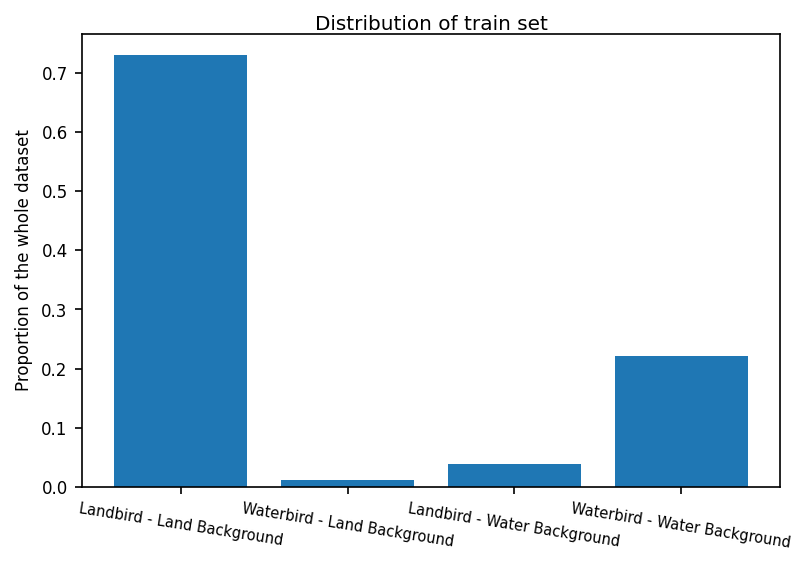

In [12]:
distribution_list = [3498 / len(waterbirds_train), 56 / len(waterbirds_train), 
                     184 / len(waterbirds_train), 1057 / len(waterbirds_train)]
combine_list = ['Landbird - Land Background', 'Waterbird - Land Background',
               'Landbird - Water Background', 'Waterbird - Water Background']

plt.bar(combine_list, distribution_list)
plt.tick_params(axis='x', labelsize=7)
plt.xticks(rotation=-9)
plt.ylabel("Proportion of the whole dataset")
plt.title("Distribution of train set")
plt.savefig("/scratch/st-kevinlb-1/will/jupyter/spotlight/picture/distribution-train")

In [81]:
# Test set
distribution_birds = np.zeros((2 , 2))

for i in range(len(waterbirds_test)):
    if np.array(waterbirds_test[i][2])[0] == 0 and np.array(waterbirds_test[i][2])[1] == 0:
        distribution_birds[0][0] += 1 # land bird land background
    elif np.array(waterbirds_test[i][2])[0] == 0 and np.array(waterbirds_test[i][2])[1] == 1:
        distribution_birds[0][1] += 1 # water bird land background
    elif np.array(waterbirds_test[i][2])[0] == 1 and np.array(waterbirds_test[i][2])[1] == 0:
        distribution_birds[1][0] += 1 # land bird water background
    else:
        distribution_birds[1][1] += 1 # water bird water background
        
print(distribution_birds)

[[2255.  642.]
 [2255.  642.]]


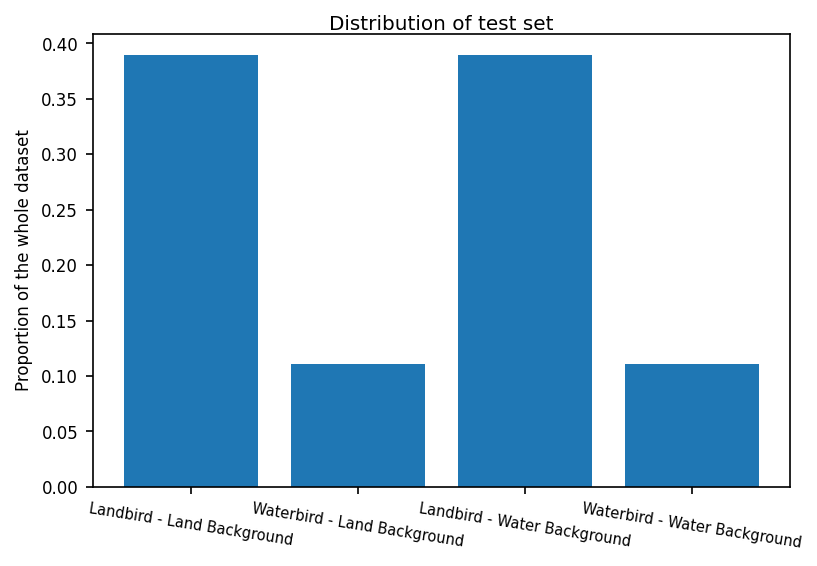

In [83]:
distribution_list = [2255 / len(waterbirds_test), 642 / len(waterbirds_test), 
                     2255 / len(waterbirds_test), 642 / len(waterbirds_test)]
combine_list = ['Landbird - Land Background', 'Waterbird - Land Background',
               'Landbird - Water Background', 'Waterbird - Water Background']

plt.bar(combine_list, distribution_list)
plt.tick_params(axis='x', labelsize=7)
plt.xticks(rotation=-9)
plt.ylabel("Proportion of the whole dataset")
plt.title("Distribution of test set")
plt.savefig("/scratch/st-kevinlb-1/will/jupyter/spotlight/picture/distribution-test")

In [84]:
# Val set
distribution_birds = np.zeros((2 , 2))

for i in range(len(waterbirds_val)):
    if np.array(waterbirds_val[i][2])[0] == 0 and np.array(waterbirds_val[i][2])[1] == 0:
        distribution_birds[0][0] += 1 # land bird land background
    elif np.array(waterbirds_val[i][2])[0] == 0 and np.array(waterbirds_val[i][2])[1] == 1:
        distribution_birds[0][1] += 1 # water bird land background
    elif np.array(waterbirds_val[i][2])[0] == 1 and np.array(waterbirds_val[i][2])[1] == 0:
        distribution_birds[1][0] += 1 # land bird water background
    else:
        distribution_birds[1][1] += 1 # water bird water background
        
print(distribution_birds)

[[467. 133.]
 [466. 133.]]


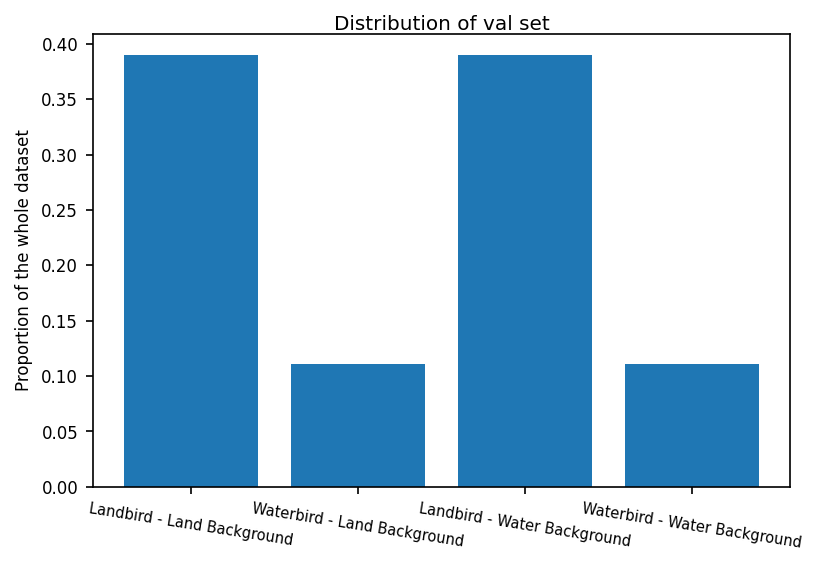

In [11]:
distribution_list = [467 / len(waterbirds_val), 133 / len(waterbirds_val), 
                     467 / len(waterbirds_val), 133 / len(waterbirds_val)]
combine_list = ['Landbird - Land Background', 'Waterbird - Land Background',
               'Landbird - Water Background', 'Waterbird - Water Background']

plt.bar(combine_list, distribution_list)
plt.tick_params(axis='x', labelsize=7)
plt.xticks(rotation=-9)
plt.ylabel("Proportion of the whole dataset")
plt.title("Distribution of val set")
plt.savefig("/scratch/st-kevinlb-1/will/jupyter/spotlight/picture/distribution-val")

## Analysis spotlight

In [64]:
def plotHighWeightImages(spotlight, data, figname=None):
    weights = spotlight.unnormalized_weights
    weight_idx = weights.argsort()[::-1]
    examples = [data[i] for i in weight_idx[:18]]
    example_losses = [losses[i] for i in weight_idx[:18]]
    images = [torch.tensor(np.array(example[0])).permute((2,0,1)) for example in examples]
    titles = [np.array(example[2]) for example in examples]
    plotImageGrid((5.5, 1.4), (8, 2), images, titles)
    plt.savefig(os.path.join('/scratch/st-kevinlb-1/will/jupyter/spotlight/picture', figname))
    plt.show()

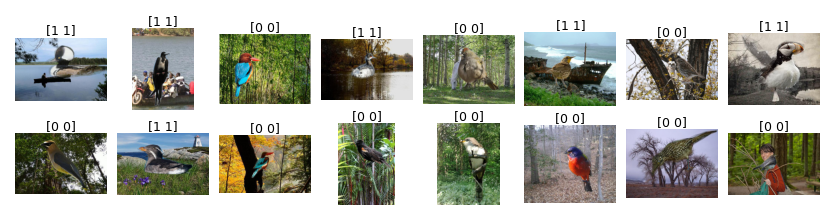

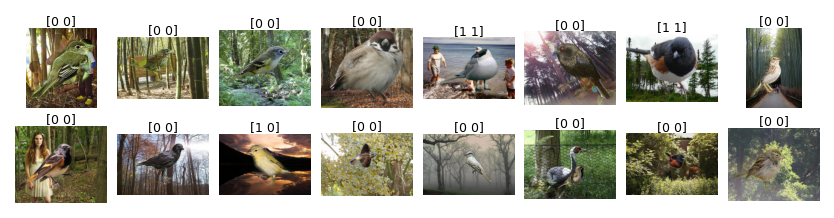

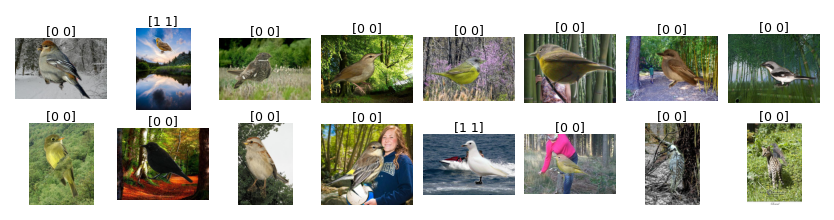

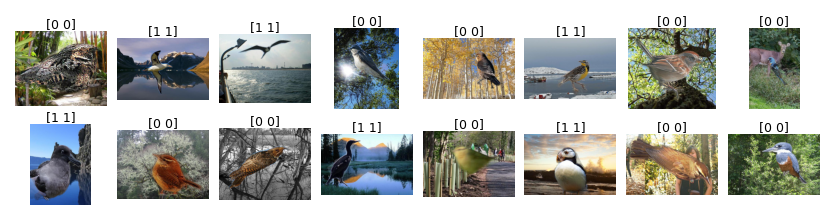

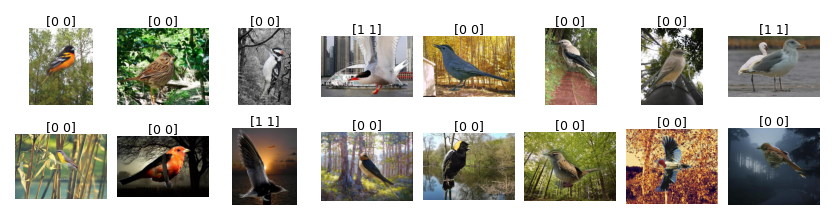

In [76]:
plotHighWeightImages(spotlights[1], waterbirds_train, 'waterbirds_train_1.png')
plotHighWeightImages(spotlights[2], waterbirds_train, 'waterbirds_train_2.png')
plotHighWeightImages(spotlights[3], waterbirds_train, 'waterbirds_train_3.png')
plotHighWeightImages(spotlights[4], waterbirds_train, 'waterbirds_train_4.png')
plotHighWeightImages(spotlights[5], waterbirds_train, 'waterbirds_train_5.png')

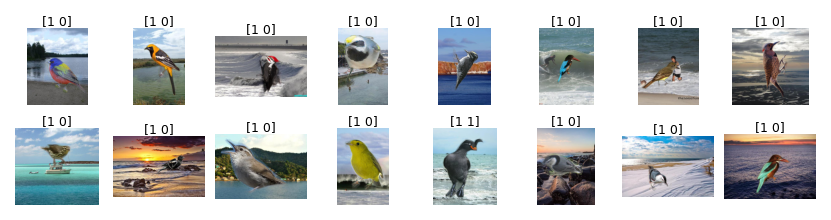

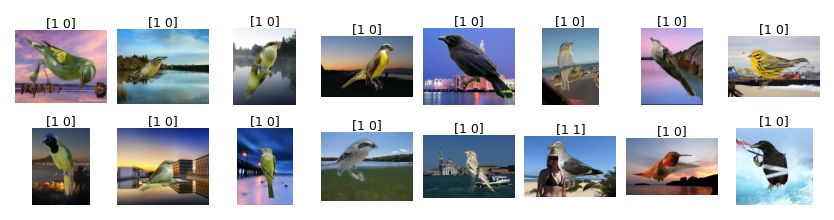

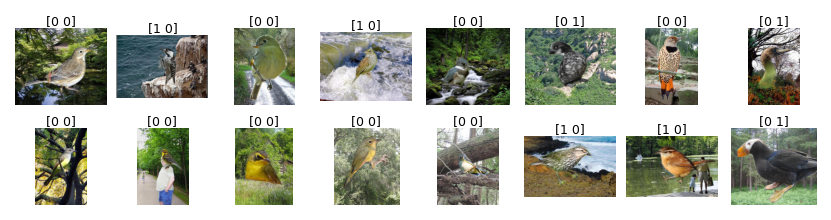

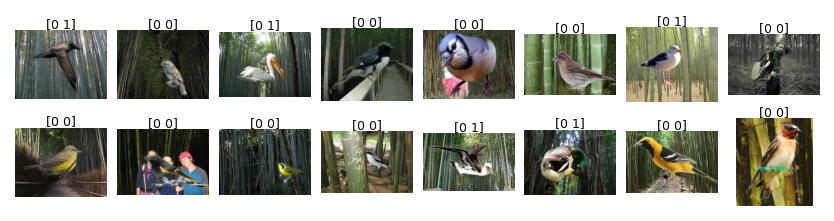

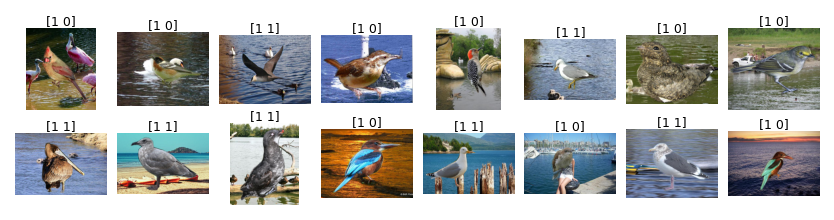

In [65]:
plotHighWeightImages(spotlights[1], waterbirds_val, 'waterbirds_val_1.png')
plotHighWeightImages(spotlights[2], waterbirds_val, 'waterbirds_val_2.png')
plotHighWeightImages(spotlights[3], waterbirds_val, 'waterbirds_val_3.png')
plotHighWeightImages(spotlights[4], waterbirds_val, 'waterbirds_val_4.png')
plotHighWeightImages(spotlights[5], waterbirds_val, 'waterbirds_val_5.png')

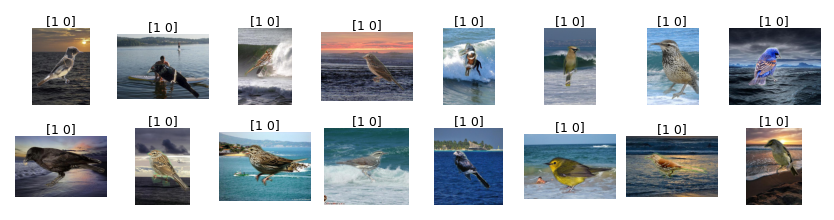

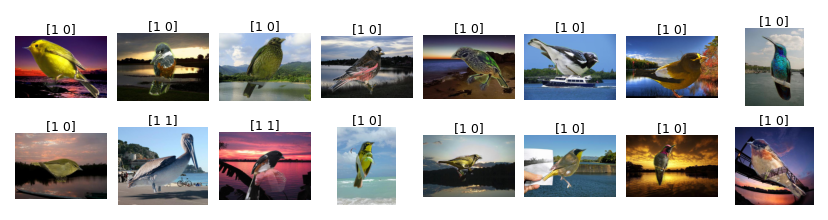

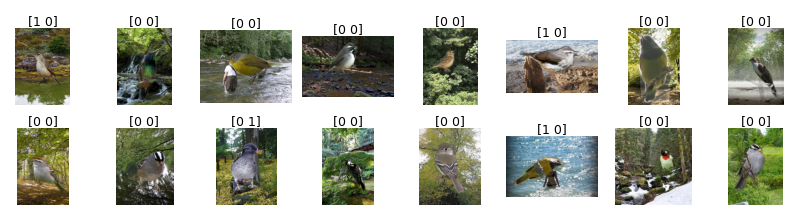

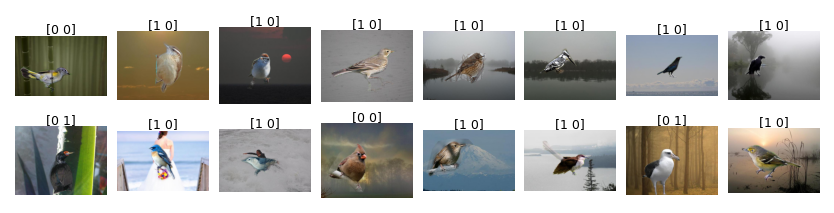

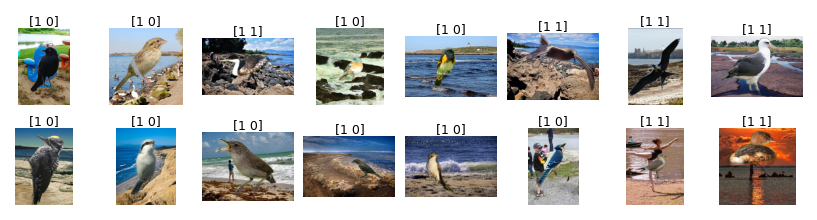

In [97]:
plotHighWeightImages(spotlights[1], waterbirds_test, 'waterbirds_test_1.png')
plotHighWeightImages(spotlights[2], waterbirds_test, 'waterbirds_test_2.png')
plotHighWeightImages(spotlights[3], waterbirds_test, 'waterbirds_test_3.png')
plotHighWeightImages(spotlights[4], waterbirds_test, 'waterbirds_test_4.png')
plotHighWeightImages(spotlights[5], waterbirds_test, 'waterbirds_test_5.png')

## Heat map & Histogram

In [88]:
# Test set
heat_map_birds = np.zeros((2 , 2))

for i in range(len(waterbirds_test)):
    if np.array(waterbirds_test[i][2])[0] == 0 and np.array(waterbirds_test[i][2])[1] == 0:
        heat_map_birds[0][0] += spotlights[5].weights[i] # land bird land background
    elif np.array(waterbirds_test[i][2])[0] == 0 and np.array(waterbirds_test[i][2])[1] == 1:
        heat_map_birds[0][1] += spotlights[5].weights[i] # water bird land background
    elif np.array(waterbirds_test[i][2])[0] == 1 and np.array(waterbirds_test[i][2])[1] == 0:
        heat_map_birds[1][0] += spotlights[5].weights[i] # land bire rd water background
    elif np.array(waterbirds_test[i][2])[0] == 1 and np.array(waterbirds_test[i][2])[1] == 1:
        heat_map_birds[1][1] += spotlights[5].weights[i] # water bird water background
        
print(heat_map_birds)

[[0.07526219 0.0279167 ]
 [0.67874856 0.21807262]]


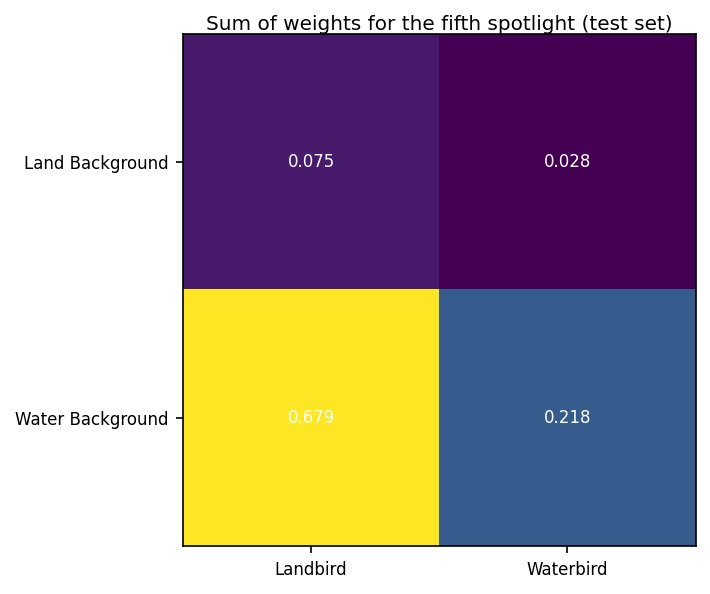

In [59]:
# Heat maps

background_classes = ["Land Background", "Water Background"]
bird_classes = ["Landbird", "Waterbird"]

fig,ax = plt.subplots()
im = ax.imshow(heat_map_birds)

ax.set_xticks(np.arange(len(bird_classes)))
ax.set_yticks(np.arange(len(background_classes)))
ax.set_xticklabels(bird_classes)
ax.set_yticklabels(background_classes)

for i in range(len(background_classes)):
    for j in range(len(bird_classes)):
        text = ax.text(j, i, round(heat_map_birds[i,j],3), ha="center", va="center", color="w")

ax.set_title("Sum of weights for the fifth spotlight (test set)")
fig.tight_layout()
plt.savefig('/scratch/st-kevinlb-1/will/jupyter/spotlight/picture/spotlight-5-heatmap-test')
plt.show()

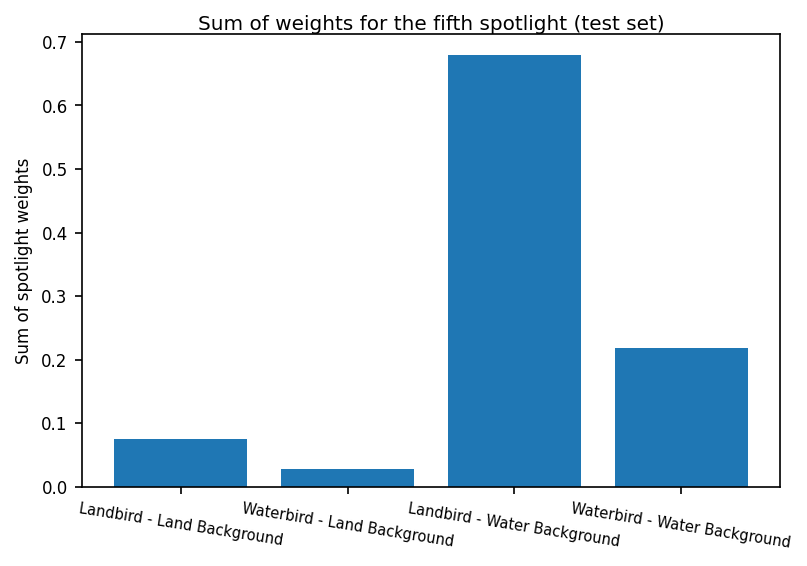

In [60]:
# histogram
combine_list = ['Landbird - Land Background', 'Waterbird - Land Background',
               'Landbird - Water Background', 'Waterbird - Water Background']
plt.bar(combine_list, [0.07526219, 0.0279167 ,0.67874856 ,0.21807262])
plt.tick_params(axis='x', labelsize=7)
plt.xticks(rotation=-9)
plt.ylabel("Sum of spotlight weights")
plt.title("Sum of weights for the fifth spotlight (test set)")
plt.savefig("/scratch/st-kevinlb-1/will/jupyter/spotlight/picture/spotlight-5-histogram-test")

In [78]:
# Val set
heat_map_birds = np.zeros((2 , 2))

for i in range(len(waterbirds_val)):
    if np.array(waterbirds_val[i][2])[0] == 0 and np.array(waterbirds_val[i][2])[1] == 0:
        heat_map_birds[0][0] += spotlights[5].weights[i] # land bird land background
    elif np.array(waterbirds_val[i][2])[0] == 0 and np.array(waterbirds_val[i][2])[1] == 1:
        heat_map_birds[0][1] += spotlights[5].weights[i] # water bird land background
    elif np.array(waterbirds_val[i][2])[0] == 1 and np.array(waterbirds_val[i][2])[1] == 0:
        heat_map_birds[1][0] += spotlights[5].weights[i] # land bird water background
    else:
        heat_map_birds[1][1] += spotlights[5].weights[i] # water bird water background
        
print(heat_map_birds)

[[0.12231527 0.04586478]
 [0.60419259 0.22762737]]


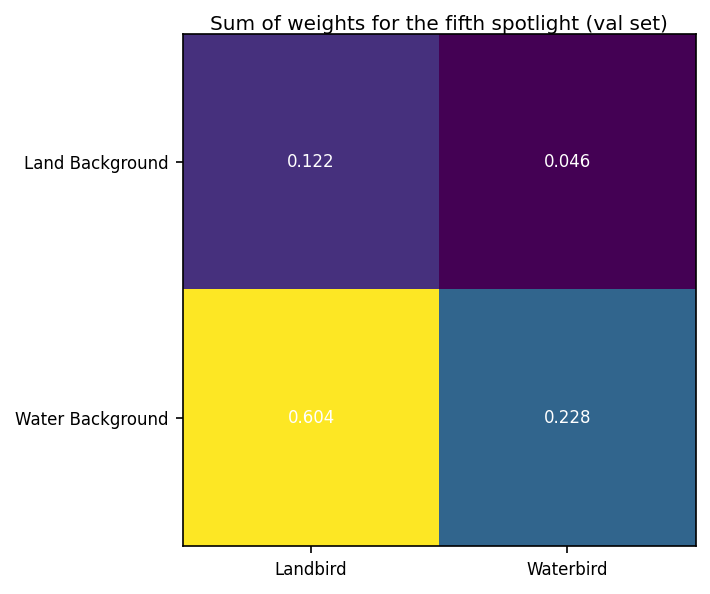

In [79]:
# Heat maps

background_classes = ["Land Background", "Water Background"]
bird_classes = ["Landbird", "Waterbird"]

fig,ax = plt.subplots()
im = ax.imshow(heat_map_birds)

ax.set_xticks(np.arange(len(bird_classes)))
ax.set_yticks(np.arange(len(background_classes)))
ax.set_xticklabels(bird_classes)
ax.set_yticklabels(background_classes)

for i in range(len(background_classes)):
    for j in range(len(bird_classes)):
        text = ax.text(j, i, round(heat_map_birds[i,j],3), ha="center", va="center", color="w")

ax.set_title("Sum of weights for the fifth spotlight (val set)")
fig.tight_layout()
plt.savefig('/scratch/st-kevinlb-1/will/jupyter/spotlight/picture/spotlight-5-heatmap-val')
plt.show()

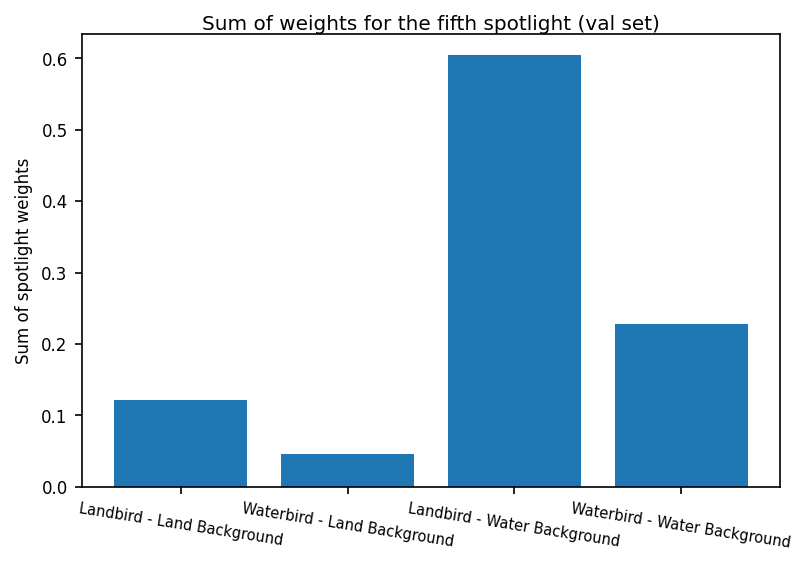

In [80]:
# histogram
combine_list = ['Landbird - Land Background', 'Waterbird - Land Background',
               'Landbird - Water Background', 'Waterbird - Water Background']
plt.bar(combine_list, [0.12231527, 0.04586478, 0.60419259, 0.22762737])
plt.tick_params(axis='x', labelsize=7)
plt.xticks(rotation=-9)
plt.ylabel("Sum of spotlight weights")
plt.title("Sum of weights for the fifth spotlight (val set)")
plt.savefig("/scratch/st-kevinlb-1/will/jupyter/spotlight/picture/spotlight-5-histogram-val")